## 라이브러리 맛보기
-  기본
    - ~~Pandas~~
    - ~~openpyxl~~
    - ~~Numpy~~
    - ~~Matplotlib~~
    - folium

### Folium
leaflet.js 기반으로 만들어진 Python 지도 시각화 라이브러리

folium을 사용하여 인터랙티브한 지도를 생성하고 마커를 추가하여 시각화하거나 원으로 범위를 표기하고 html 파일로 내보내기 등을 수행할 수 있슴

**최고의 튜토리얼 사이트**

https://python-graph-gallery.com/288-map-background-with-folium/ 

#### Folium 설치
```python
!pip install folium
```

In [1]:
!pip install folium

#### 모듈 추가
```python
import folium
```

In [1]:
import folium

##### 기본좌표 설정

location에 위도, 경도 정보를 입력하여 입력한 위,경도 좌표를 기준으로 지도를 표시.

이때 zoom_start 정보를 지정하여 확대의 정도를 지정가능 하며 zoom_start의 범위는 최대 18.

지도의 위경도를 찾는 가장 간단한 방법
- https://map.google.com

구글 지도에서 위치 딜레이 더블클릭으로 위경도 찾기(기본 마터가 있는 곳을 피할 것)

In [8]:
lat = 35.117562
lng = 129.090558

In [ ]:
for x in range(len(target_df)):

    if target_df['type'][x] == 'A':
        color = 'blue'
    elif target_df['type'][x] == 'B':
        color = 'red'
    elif target_df['type'][x] == 'C':    
        color = 'green'
    elif target_df['type'][x] == 'D':    
        color = 'gray'
    else:
        color = 'white'  # 미확인

    location = (lat, lng)

In [3]:
## width, height, tiles
m = folium.Map(location=[lat, lng],
               zoom_start=17)
m

##### 마커 표시

In [4]:
folium.Marker(location=[lat, lng],
              popup='부경대 용당캠퍼스 종합복지관',
              tooltip='빅데이터 학습').add_to(m)

m

##### 마커 변경

마커의 값은 fontawesome 아이콘을 활용함
- https://fontawesome.com/icons 에서 검색 사용할 것
- https://getbootstrap.com/docs/3.3/components/#glyphicons-glyphs 이 확실시

In [5]:
## 도움말로 확인해볼 것
help(folium.Icon)

Help on class Icon in module folium.map:

class Icon(branca.element.MacroElement)
 |  Icon(color: str = 'blue', icon_color: str = 'white', icon: str = 'info-sign', angle: int = 0, prefix: str = 'glyphicon', **kwargs: Union[str, float, bool, Sequence, dict, NoneType])
 |  
 |  Creates an Icon object that will be rendered
 |  using Leaflet.awesome-markers.
 |  
 |  Parameters
 |  ----------
 |  color : str, default 'blue'
 |      The color of the marker. You can use:
 |  
 |          ['red', 'blue', 'green', 'purple', 'orange', 'darkred',
 |           'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue',
 |           'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen',
 |           'gray', 'black', 'lightgray']
 |  
 |  icon_color : str, default 'white'
 |      The color of the drawing on the marker. You can use colors above,
 |      or an html color code.
 |  icon : str, default 'info-sign'
 |      The name of the marker sign.
 |      See Font-Awesome website to choose yours.


##### 해당위치의 아이콘까지 확인됨

![IconList](https://raw.githubusercontent.com/hugoMGSung/bigdata-analysis-2023/main/Images/bigdata003.jpg)

In [6]:
folium.Marker(location=[lat, lng],
              popup='부경대 용당캠퍼스 종합복지관',
              tooltip='빅데이터 학습',
              icon=folium.Icon('red', icon='phone-alt')).add_to(m)

m

##### 기타 마커 설정

popup이나 tooltip에 html 코드를 삽입하여 이미지를 표기하거나 심지어 YouTube 영상도 삽입할 수 있슴

In [8]:
m = folium.Map(location=[lat, lng],
               zoom_start=17)

folium.Marker([lat, lng],
              popup='<iframe width="560" height="315" src="https://www.youtube.com/embed/PSTh23pWPjc" title="아소카 미리보기" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>',
              tooltip='부경대').add_to(m)

m

#### 행정구역 경계표시

##### SHP 파일에서 대한민국 geojson 획득법

https://blog.naver.com/kcchang61/221350672356

In [9]:
## 부산 행정구역 데이터 로드
import requests
import json

In [10]:
# 부산 행정구역 json raw파일(githubcontent)
r = requests.get('https://raw.githubusercontent.com/hugoMGSung/bigdata-analysis-2023/main/Datas/busan_gu.json')
c = r.content
busan_geo = json.loads(c)

In [11]:
lat = 35.174364
lng = 129.053356

m = folium.Map(
    location=[lat, lng],
    zoom_start=10, 
)

folium.GeoJson(
    busan_geo,
    name='지역구').add_to(m)

m

##### 타일 종류 변경

- 타일(Tile) 기본 : OpenStreetMap
- 변경 가능 타일(대소문자구분 및 띄워쓰기 없음)
    - Stamen Toner
    - Stamen Terrain
    - stamen Watercolor
    - Cartodb Positron
    - cartodbdark_matter
    - Mapbox 적용불가
    

In [12]:
m = folium.Map(
    location=[lat, lng],
    zoom_start=10,
    tiles='cartodbdark_matter'
    )

folium.GeoJson(
    busan_geo, name='지역구').add_to(m)

m

##### 소상공인시장 진흥공단 상권 정보

https://www.data.go.kr/data/15083033/fileData.do 에서 다운로드(대략 285MB) 중 부산데이터 활용


In [13]:
import pandas as pd

In [14]:
busan_business = pd.read_csv('https://raw.githubusercontent.com/hugoMGSung/bigdata-analysis-2023/main/Datas/%EC%86%8C%EC%83%81%EA%B3%B5%EC%9D%B8%EC%8B%9C%EC%9E%A5%EC%A7%84%ED%9D%A5%EA%B3%B5%EB%8B%A8_%EC%83%81%EA%B6%8C%EC%A0%95%EB%B3%B4_%EB%B6%80%EC%82%B0_202306.csv')

## 필요한 컬럼 정보만
busan_business = busan_business[['시군구명', '상권업종대분류명', '상권업종중분류명', '위도', '경도']]
busan_business

C:\Users\perso\AppData\Local\Temp\ipykernel_42780\1843906859.py:1: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  busan_business = pd.read_csv('https://raw.githubusercontent.com/hugoMGSung/bigdata-analysis-2023/main/Datas/%EC%86%8C%EC%83%81%EA%B3%B5%EC%9D%B8%EC%8B%9C%EC%9E%A5%EC%A7%84%ED%9D%A5%EA%B3%B5%EB%8B%A8_%EC%83%81%EA%B6%8C%EC%A0%95%EB%B3%B4_%EB%B6%80%EC%82%B0_202306.csv')


,시군구명,상권업종대분류명,상권업종중분류명,위도,경도
0,금정구,음식,한식,35.223363,129.113321
1,해운대구,소매,섬유·의복·신발 소매,35.169873,129.131099
2,강서구,소매,섬유·의복·신발 소매,35.093125,128.918174
3,북구,수리·개인,이용·미용,35.235217,129.011641
4,중구,음식,비알코올,35.098035,129.033875
...,...,...,...,...,...
153526,부산진구,소매,식료품 소매,35.159462,129.031062
153527,기장군,음식,비알코올,35.319494,129.174387
153528,사하구,음식,서양식,35.110490,128.964167
153529,남구,교육,기타 교육,35.138025,129.083013


##### 부산의 업종별 개수를 시각화

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

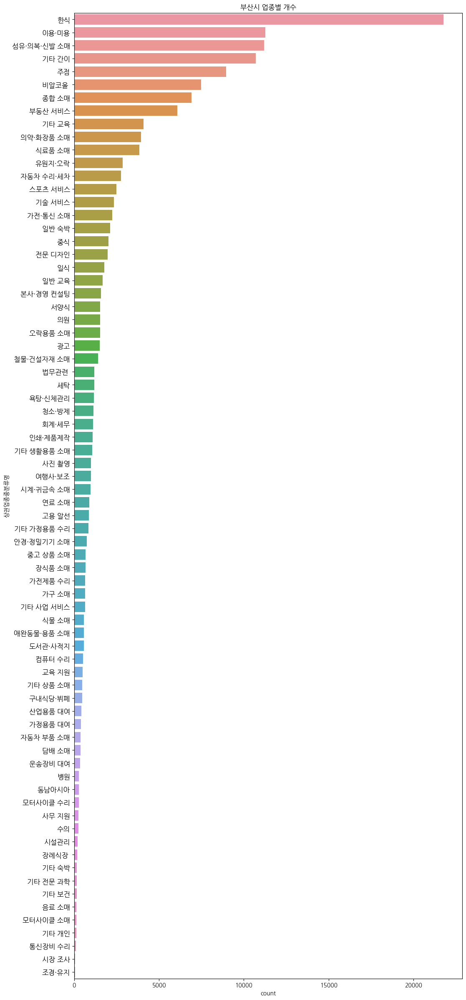

In [16]:
# 한글 폰트 설정
plt.rcParams['font.family'] = 'NanumGothic'

plt.figure(figsize=(12, 30))
sns.countplot(y=busan_business['상권업종중분류명'], order=busan_business['상권업종중분류명'].value_counts().index)
plt.yticks(fontsize=12)
plt.title('부산시 업종별 개수')
plt.show()

##### 분석

한식 업종이 가장 많은 개수를 차지. 섬유/의복/신발 다음 이미용, 기타 간이, 주점 순

한식 업종 구별 분포 시각화


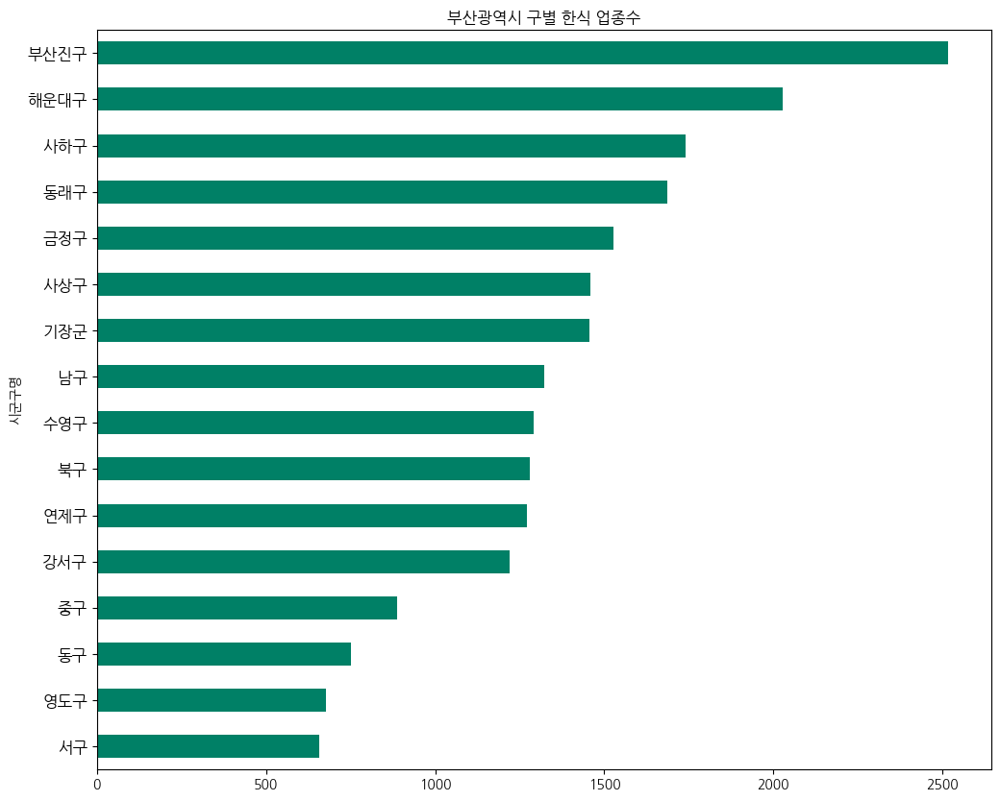

In [17]:
plt.figure(figsize=(12, 10))
busan_business.loc[busan_business['상권업종중분류명'] == '한식'].groupby('시군구명')['상권업종대분류명'].count() \
                                                     .sort_values().plot(kind='barh', colormap='summer')
plt.yticks(fontsize=12)
plt.title('부산광역시 구별 한식 업종수')
plt.show()

##### Folium 시각화

In [18]:
# 한식 구별 위치 표시
busan_korean = busan_business.loc[busan_business['상권업종중분류명'] == '한식']
busan_korean

,시군구명,상권업종대분류명,상권업종중분류명,위도,경도
0,금정구,음식,한식,35.223363,129.113321
9,연제구,음식,한식,35.189086,129.100303
11,강서구,음식,한식,35.096705,128.923972
15,기장군,음식,한식,35.369086,129.245476
17,영도구,음식,한식,35.087970,129.040788
...,...,...,...,...,...
153468,연제구,음식,한식,35.190736,129.079210
153470,남구,음식,한식,35.124403,129.112017
153489,남구,음식,한식,35.136234,129.070524
153504,수영구,음식,한식,35.176254,129.115588


In [19]:
from folium.plugins import MarkerCluster

##### 시간 많이 소요됨 

In [20]:
m = folium.Map(
    location=[lat, lng],
    zoom_start=11, 
    tiles='cartodbpositron'
)

folium.GeoJson(
    busan_geo,
    name='지역구'
).add_to(m)

marker_cluster = MarkerCluster().add_to(m)

for lat, long in zip(busan_korean['위도'], busan_korean['경도']):
    folium.Marker([lat, long], icon = folium.Icon(color='green')).add_to(marker_cluster)

m

##### 구역별 색상으로 표시



In [21]:
busan_group_data = busan_business.loc[busan_business['상권업종중분류명'] == '한식'].groupby('시군구명')['상권업종중분류명'].count()
busan_group_data

시군구명
강서구     1221
금정구     1526
기장군     1456
남구      1323
동구       750
동래구     1687
부산진구    2518
북구      1281
사상구     1459
사하구     1740
서구       657
수영구     1291
연제구     1271
영도구      676
중구       888
해운대구    2028
Name: 상권업종중분류명, dtype: int64

##### choropleth 를 사용하여 한식 개수별 색상의 차이로 시각화

In [22]:
m = folium.Map(
    location=[lat, lng],
    zoom_start=11, 
    tiles='cartodbpositron'
)

folium.GeoJson(
    busan_geo,
    name='지역구'
).add_to(m)

m.choropleth(geo_data=busan_geo,
             data=busan_group_data, 
             fill_color='YlOrRd', # 색상 변경 가능
             fill_opacity=0.5,
             line_opacity=0.2,
             key_on='properties.name',
             legend_name="지역구별 한식 수"
            )
m

c:\DEV\LANGS\Python\Python311\Lib\site-packages\folium\folium.py:465: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


##### bins로 분위수별로 구간 나누어 시각화

In [23]:
bins = list(busan_group_data.quantile([0, 0.25, 0.5, 0.75, 1]))

m = folium.Map(
    location=[lat, lng],
    zoom_start=11, 
    tiles='cartodbpositron'
)

folium.GeoJson(
    busan_geo,
    name='지역구'
).add_to(m)

m.choropleth(geo_data=busan_geo,
             data=busan_group_data, 
             fill_color='YlOrRd', # 색상 변경 가능
             fill_opacity=0.5,
             line_opacity=0.2,
             key_on='properties.name',
             legend_name="지역구별 한식 수", 
             bins=bins
            )
m

c:\DEV\LANGS\Python\Python311\Lib\site-packages\folium\folium.py:465: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


##### HTML 저장

In [24]:
m.save('./result/busan_korean_restaurent.html')